# Infer Population Model Parameters from Individuals in Lung Cancer Control Group

In [23]:
import os

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pints
import plotly.colors
import xarray as xr

import erlotinib as erlo

## Show control group data

In [2]:
# Get data
data = erlo.DataLibrary().lung_cancer_control_group()

# Create scatter plot
fig = erlo.plots.PDTimeSeriesPlot()
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')

# Show figure
fig.show()

**Figure 1:** Visualisation of the measured tumour growth in 8 mice with patient-derived lung cancer implants.

## Visualise posterior distribution

In [3]:
# Import
path = os.getcwd()
path = os.path.join(path, 'posteriors', 'gaussian_population_model.nc')
posterior_samples = xr.load_dataset(path)

# Rename to orginal variable names
posterior_samples = posterior_samples.rename({
    'initial_tumour_volume': 'Tumour volume in cm^3',
    'mu_initial_tumour_volume': 'Mu Tumour volume in cm^3',
    'sigma_initial_tumour_volume': 'Sigma Tumour volume in cm^3',
    'critical_tumour_volume': 'Critical volume in cm^3',
    'mu_critical_tumour_volume': 'Mu Critical volume in cm^3',
    'sigma_critical_tumour_volume': 'Sigma Critical volume in cm^3',
    'growth_rate': 'Exponential growth rate in 1/day',
    'mu_growth_rate': 'Mu Exponential growth rate in 1/day',
    'sigma_growth_rate': 'Sigma Exponential growth rate in 1/day',
    'pooled_sigma_rel': 'Pooled Sigma rel.'})

# Plot marginal posteriors
fig = erlo.plots.MarginalPosteriorPlot()
fig.add_data(data=posterior_samples)

fig.show()

**Figure 2:** Marginal posterior distributions of model parameters. The y axis displays the sampled parameter value, and the x axis the binned number of samples for each individual.

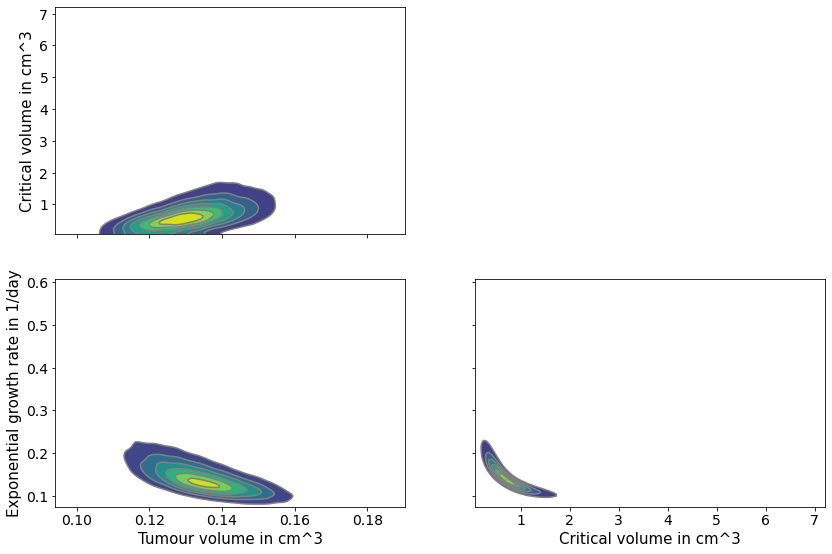

In [4]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 136'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

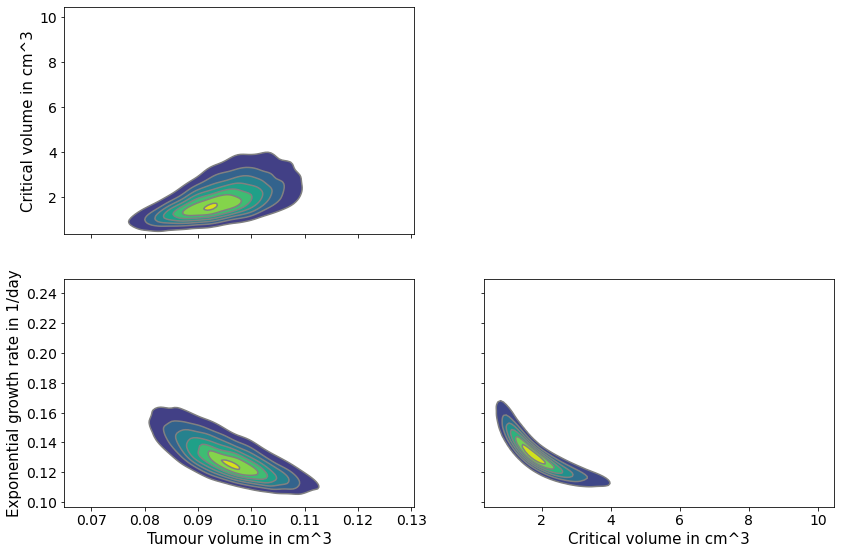

In [5]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 140'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

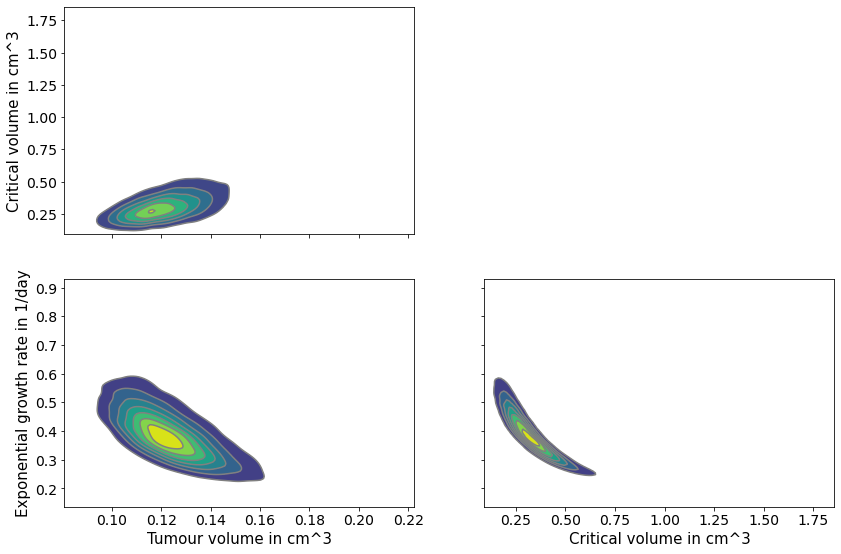

In [6]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 155'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

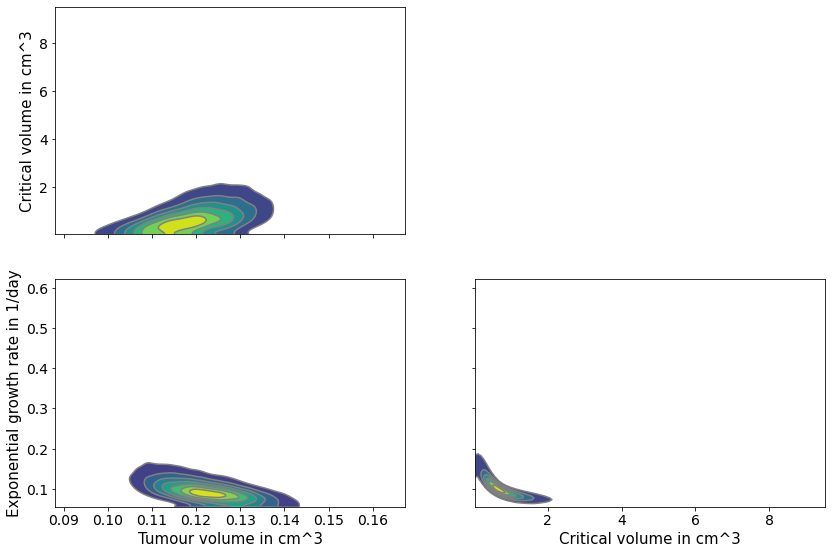

In [7]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 169'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

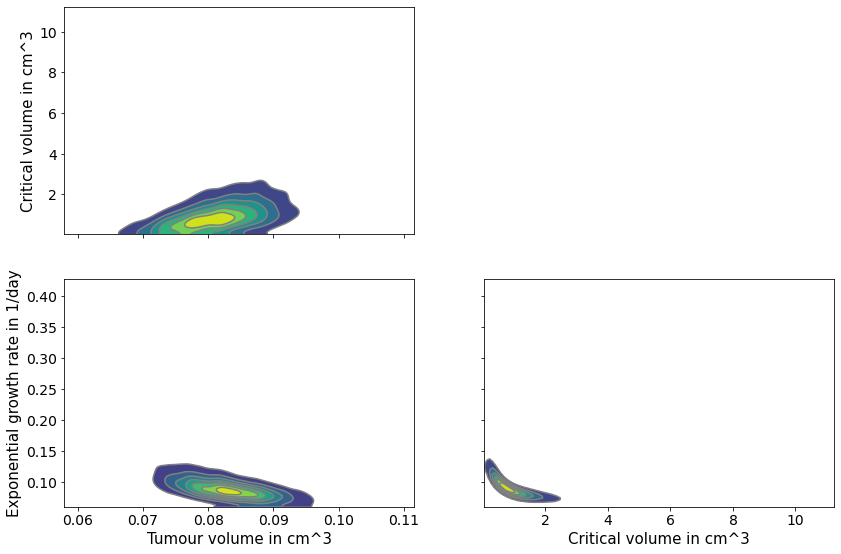

In [8]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 170'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

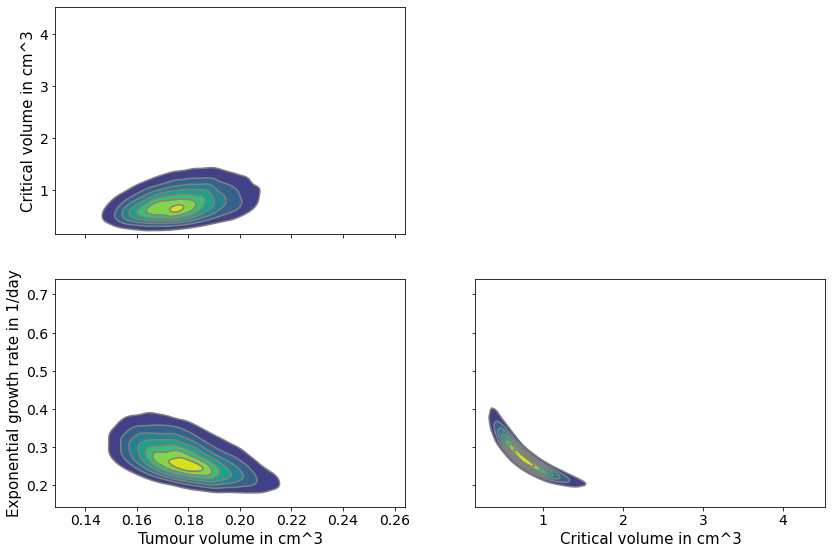

In [9]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 40'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

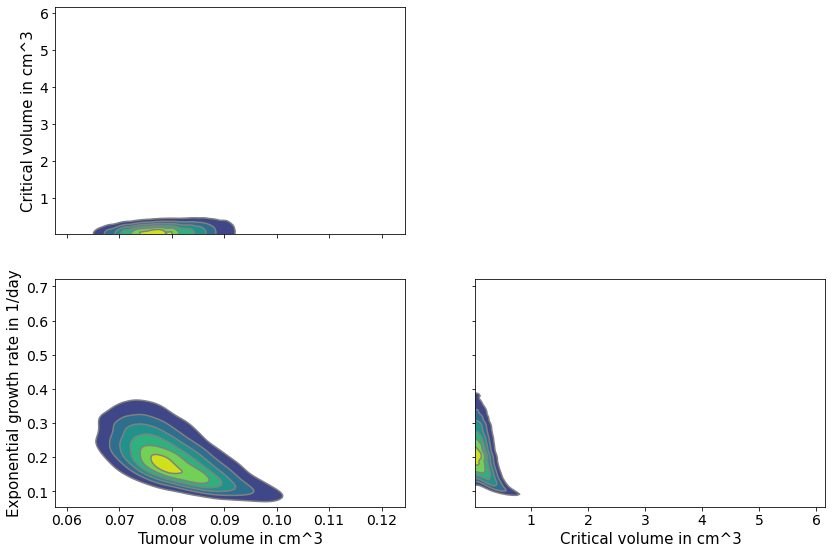

In [10]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 94'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

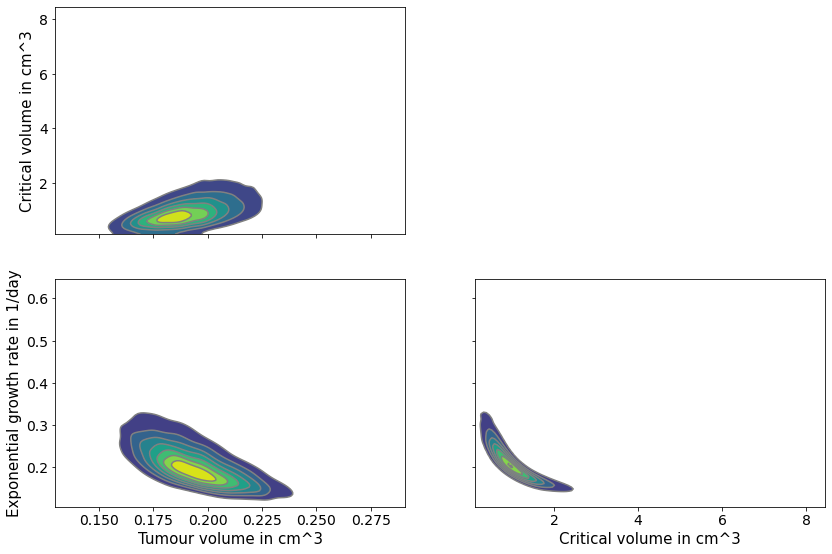

In [11]:
az.plot_pair(
    posterior_samples,
    kind='kde',
    coords={'individual':'ID 95'},
    var_names=[
        'Tumour volume in cm^3',
        'Critical volume in cm^3',
        'Exponential growth rate in 1/day'])
plt.show()

**Figure 3:** 2 dimensional marginal posterior distributions of model parameters. The x and y axis represent values of different model parameters and the colouring indicate low (blue) to high (yellow) probability mass.

## Evaluate model

### Build model

In [25]:
# Define mechanistic model
path = erlo.ModelLibrary().tumour_growth_inhibition_model_koch_reparametrised()
mechanistic_model = erlo.PharmacodynamicModel(path)
mechanistic_model.set_parameter_names(names={
    'myokit.tumour_volume': 'Tumour volume in cm^3',
    'myokit.critical_volume': 'Critical volume in cm^3',
    'myokit.drug_concentration': 'Drug concentration in mg/L',
    'myokit.kappa': 'Potency in L/mg/day',
    'myokit.lambda': 'Exponential growth rate in 1/day'})
mechanistic_model.set_output_names({
    'myokit.tumour_volume': 'Tumour volume'})

# Define error model
error_model = erlo.ConstantAndMultiplicativeGaussianErrorModel()

# Compose model and not identified parameters
problem = erlo.ProblemModellingController(mechanistic_model, error_model)
problem.fix_parameters({
    'Drug concentration in mg/L': 0,
    'Potency in L/mg/day': 0,
    'Sigma base': 0.001})

# Define posterior predictive model
predictive_model = problem.get_predictive_model()
posterior_predictive_model = erlo.PosteriorPredictiveModel(
    predictive_model, posterior_samples, param_map={'Sigma rel.': 'Pooled Sigma rel.'})

### Posterior predictive check and LOO

In [14]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 40')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [15]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 94')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [16]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 95')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [17]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 136')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [18]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 140')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [19]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 155')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [20]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 169')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

In [21]:
# Sample from posterior predictive model
times = np.linspace(0, 30)
n_samples = 1000
samples = posterior_predictive_model.sample(times, n_samples, individual='ID 170')

# Visualise posterior predictive distributions
fig = erlo.plots.PDPredictivePlot()
fig.add_prediction(data=samples)
fig.add_data(data, biomarker='Tumour volume')
fig.set_axis_labels(xlabel=r'$\text{Time in day}$', ylabel=r'$\text{Tumour volume in cm}^3$')
fig.show()

**Figure 4:** Posterior predictive model for each individual over time. The shaded area illustrates the approximate 90% bulk probability of the posterior predictive model constructed from 1000 samples for each of 50 equidistant time points. The circles represent the measurements of the individuals which were used for the inference.

In [26]:
# Create residual plot
fig = erlo.plots.ResidualPlot(measurements=data)

# Add predictions for each individual to figure
n_samples = 1000
ids = data.ID.unique()
colors = plotly.colors.qualitative.Plotly
for index, _id in enumerate(ids):
    # Compute posterior predictive distribution for ID
    mask = (data.ID == _id) | (data.Biomarker == 'Tumour volume')
    times = data[mask].Time.unique()
    samples = posterior_predictive_model.sample(
        times, n_samples, individual='ID %d' % _id)
    fig.add_data(data=samples, individual=_id, show_residuals=True, show_relative=True)
    fig._fig.data[-1].marker.color = colors[index]

fig.show()